# Clasificador de Imágenes para la detección de Pneumonia normal y la Pneumonia Vírica

### Importar Librerías

In [1]:
from PIL import Image
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
from keras.utils import to_categorical, plot_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator,array_to_img, img_to_array, load_img
from tensorflow.keras import optimizers,layers
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from IPython.display import Image
import itertools
import seaborn as sns
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.optimizers import SGD
from IPython.display import Image
from PIL import Image

### Clasificación 1: Pneumonia vs Normal


### Preparación

In [2]:
# Directorios de entrenamiento, validación y prueba
train_dir = 'archive2/train'
test_dir = 'archive2/test'

# Altura y anchura de la imagen
img_width, img_height = 256, 256
# Tamaño de lote
batch_size = 64
# Epocas
epochs = 5000

# Preprocesar los datos de imagen utilizando ImageDataGenerator

test_datagen = ImageDataGenerator()

train_generator_1 = tf.keras.preprocessing.image_dataset_from_directory(train_dir, 
                                                      image_size=(img_width, img_height),
                                                      batch_size=batch_size,
                                                      validation_split=0.2,
                                                        subset="training",
                                                      seed=1234, 
                                                      label_mode='categorical',)

val_generator_1 = tf.keras.preprocessing.image_dataset_from_directory(train_dir, 
                                                    image_size=(img_width, img_height),
                                                    batch_size=batch_size, 
                                                    validation_split=0.2,
                                                    subset="validation",
                                                    seed=1234,
                                                    label_mode='categorical')

test_generator_1 = test_datagen.flow_from_directory(test_dir, 
                                                    seed=1234,
                                                    target_size=(img_height, img_width),
                                                    class_mode="categorical", batch_size=32,
                                                    shuffle=False)



Found 4041 files belonging to 3 classes.
Using 3233 files for training.
Found 4041 files belonging to 3 classes.
Using 808 files for validation.
Found 114 images belonging to 3 classes.


In [3]:
class StopTrainingCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('loss') < 0.2:
            print('\nSe ha alcanzado el valor de pérdida deseado.')
            self.model.stop_training = True

In [4]:
'''
# Ruta de la carpeta con las imágenes originales
ruta_originales = "archive2/train/adidas/"

# Cargar todas las imágenes en la carpeta
imagenes_originales = []
for filename in os.listdir(ruta_originales):
    imagen = Image.open(os.path.join(ruta_originales, filename))
    imagenes_originales.append(imagen)

# Definir las transformaciones de data augmentation
datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

# Generar nuevas imágenes utilizando las transformaciones definidas
for imagen in imagenes_originales:
    x = imagen.resize((256, 256))
    x = x.convert('RGB')
    x = np.array(x)
    x = x.reshape((1,) + x.shape)
    i = 0
    for batch in datagen.flow(x, batch_size=1, save_to_dir='archive2/train/adidas/', save_prefix='aug', save_format='jpeg'):
        i += 1
        if i > 4: # Generar 2 imágenes nuevas por cada imagen original
            break
# Ruta de la carpeta con las imágenes originales
ruta_originales = "archive2/train/converse/"

# Cargar todas las imágenes en la carpeta
imagenes_originales = []
for filename in os.listdir(ruta_originales):
    imagen = Image.open(os.path.join(ruta_originales, filename))
    imagenes_originales.append(imagen)

# Definir las transformaciones de data augmentation
datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

# Generar nuevas imágenes utilizando las transformaciones definidas
for imagen in imagenes_originales:
    x = imagen.resize((256, 256))
    x = x.convert('RGB')
    x = np.array(x)
    x = x.reshape((1,) + x.shape)
    i = 0
    for batch in datagen.flow(x, batch_size=1, save_to_dir='archive2/train/converse/', save_prefix='aug', save_format='jpeg'):
        i += 1
        if i > 4: # Generar 2 imágenes nuevas por cada imagen original
            break

# Ruta de la carpeta con las imágenes originales
ruta_originales = "archive2/train/nike/"

# Cargar todas las imágenes en la carpeta
imagenes_originales = []
for filename in os.listdir(ruta_originales):
    imagen = Image.open(os.path.join(ruta_originales, filename))
    imagenes_originales.append(imagen)

# Definir las transformaciones de data augmentation
datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

# Generar nuevas imágenes utilizando las transformaciones definidas
for imagen in imagenes_originales:
    x = imagen.resize((256, 256))
    x = x.convert('RGB')
    x = np.array(x)
    x = x.reshape((1,) + x.shape)
    i = 0
    for batch in datagen.flow(x, batch_size=1, save_to_dir='archive2/train/nike/', save_prefix='aug', save_format='jpeg'):
        i += 1
        if i > 4: # Generar 2 imágenes nuevas por cada imagen original
            break
'''

'\n# Ruta de la carpeta con las imágenes originales\nruta_originales = "archive2/train/adidas/"\n\n# Cargar todas las imágenes en la carpeta\nimagenes_originales = []\nfor filename in os.listdir(ruta_originales):\n    imagen = Image.open(os.path.join(ruta_originales, filename))\n    imagenes_originales.append(imagen)\n\n# Definir las transformaciones de data augmentation\ndatagen = ImageDataGenerator(\n        rotation_range=20,\n        width_shift_range=0.1,\n        height_shift_range=0.1,\n        shear_range=0.2,\n        zoom_range=0.2,\n        horizontal_flip=True,\n        fill_mode=\'nearest\')\n\n# Generar nuevas imágenes utilizando las transformaciones definidas\nfor imagen in imagenes_originales:\n    x = imagen.resize((256, 256))\n    x = x.convert(\'RGB\')\n    x = np.array(x)\n    x = x.reshape((1,) + x.shape)\n    i = 0\n    for batch in datagen.flow(x, batch_size=1, save_to_dir=\'archive2/train/adidas/\', save_prefix=\'aug\', save_format=\'jpeg\'):\n        i += 1\n  

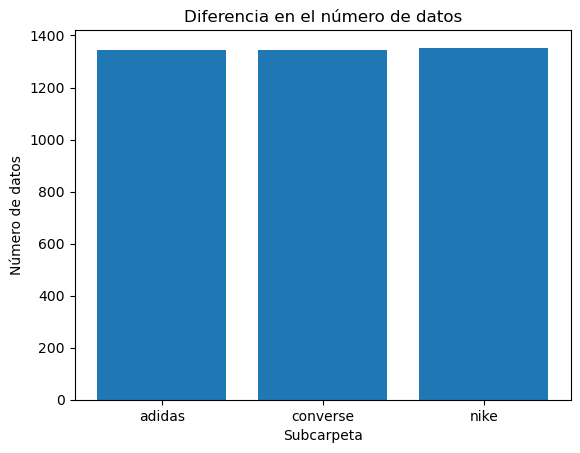

In [5]:
# Ruta de la carpeta con los datos
ruta_datos = "archive2/train/"

# Crear una lista con los nombres de todas las subcarpetas en la carpeta con los datos
subcarpetas = [nombre for nombre in os.listdir(ruta_datos) if os.path.isdir(os.path.join(ruta_datos, nombre))]

# Crear un diccionario con la información del número de datos en cada subcarpeta
datos = {}
for subcarpeta in subcarpetas:
    ruta_subcarpeta = os.path.join(ruta_datos, subcarpeta)
    numero_datos = len(os.listdir(ruta_subcarpeta))
    datos[subcarpeta] = numero_datos

# Crear un dataframe con la información del número de datos en cada subcarpeta
df = pd.DataFrame.from_dict(datos, orient='index', columns=['Número de datos'])

# Crear un gráfico de barras para visualizar la diferencia en el número de datos
plt.bar(df.index, df['Número de datos'])
plt.title('Diferencia en el número de datos')
plt.xlabel('Subcarpeta')
plt.ylabel('Número de datos')
plt.show()

#### Entrenamiento

In [6]:
model = Sequential()
normalization_layer = layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3))
model.add(normalization_layer)
# capa de convolución 1
model.add(Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), padding='valid', input_shape=(img_height,img_width,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='valid'))

# capa de convolución 2
model.add(Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='valid'))

# capa de convolución 3
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='same'))
model.add(Activation('relu'))

# capa de convolución 4
model.add(Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), padding='same'))
model.add(Activation('relu'))

# capa de convolución 5
model.add(Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(3,3), strides=(2,2), padding='valid'))

# capa completamente conectada 1
model.add(Flatten())
model.add(Dense(4096, input_shape=(200*200,)))
model.add(Activation('relu'))
model.add(Dropout(0.4))

# capa completamente conectada 2
model.add(Dense(4096))
model.add(Activation('relu'))
model.add(Dropout(0.4))

# capa de salida
model.add(Dense(3))
model.add(Activation('softmax'))

# compilar el modelo
model.compile(loss='categorical_crossentropy', optimizer=SGD(learning_rate = 0.01), metrics=['accuracy'])

stop_training_callback = StopTrainingCallback()
history = model.fit(
        train_generator_1,
        epochs = epochs,
        validation_data = val_generator_1,
        callbacks = [stop_training_callback],
)

Epoch 1/5000
51/51 [==============================] - 140s 3s/step - loss: 1.1001 - accuracy: 0.3115 - val_loss: 1.0975 - val_accuracy: 0.3651
Epoch 2/5000
51/51 [==============================] - 147s 3s/step - loss: 1.0977 - accuracy: 0.3508 - val_loss: 1.0967 - val_accuracy: 0.3515
Epoch 3/5000
51/51 [==============================] - 144s 3s/step - loss: 1.0972 - accuracy: 0.3461 - val_loss: 1.0947 - val_accuracy: 0.4295
Epoch 4/5000
51/51 [==============================] - 152s 3s/step - loss: 1.0954 - accuracy: 0.3798 - val_loss: 1.0933 - val_accuracy: 0.4480
Epoch 5/5000
51/51 [==============================] - 143s 3s/step - loss: 1.0951 - accuracy: 0.3789 - val_loss: 1.0932 - val_accuracy: 0.3936
Epoch 6/5000
51/51 [==============================] - 152s 3s/step - loss: 1.0931 - accuracy: 0.3718 - val_loss: 1.0934 - val_accuracy: 0.3453
Epoch 7/5000
51/51 [==============================] - 142s 3s/step - loss: 1.0892 - accuracy: 0.3848 - val_loss: 1.0901 - val_accuracy: 0.4035

In [7]:
import winsound

# Reproduce un pitido durante 1 segundo a 440 Hz
duration = 1000  # duración en milisegundos
freq = 440  # frecuencia en Hz
winsound.Beep(freq, duration)

#### Arquitectura de la red dibujada

51/51 [==============================] - 53s 1s/step - loss: 0.1083 - accuracy: 0.9681
Train accuracy: 0.9681410193443298
Train loss: 0.10834932327270508
4/4 [==============================] - 2s 491ms/step - loss: 0.9312 - accuracy: 0.7018
Test accuracy: 0.7017543911933899
Test loss: 0.9311857223510742


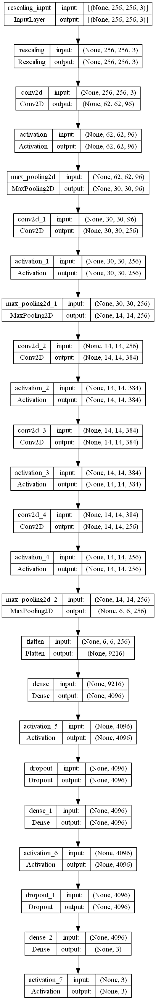

In [21]:
from IPython.display import Image
# Guarda la imagen del modelo
plot_model(model, to_file = 'modeloCalificaciónKaggle.png', show_shapes=True)
# Evaluar el modelo con los datos de entrenamiento
train_loss, train_acc = model.evaluate(train_generator_1)
print('Train accuracy:', train_acc)
print('Train loss:', train_loss)

# Evaluar el modelo con los datos de prueba
test_loss, test_acc = model.evaluate(test_generator_1)
print('Test accuracy:', test_acc)
print('Test loss:', test_loss)

# Muestra la imagen del modelo
Image(filename = 'modeloCalificaciónKaggle.png')

#### Gráfica de Variación del error según los epochs

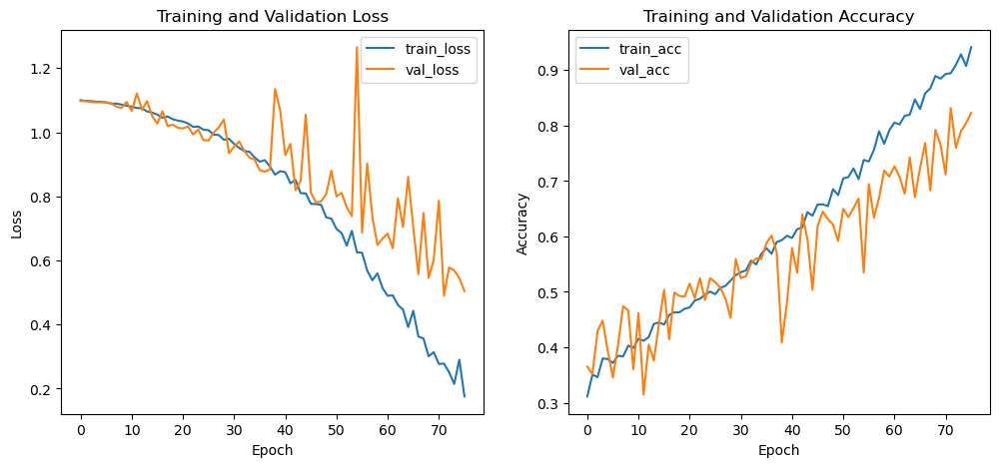

4/4 [==============================] - 1s 316ms/step


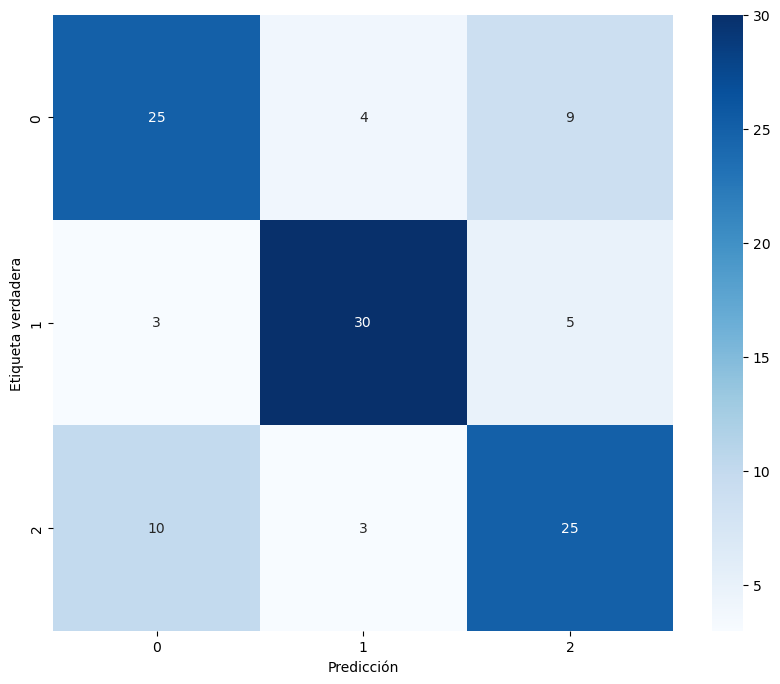

In [9]:
# Obtener los valores de loss y accuracy del entrenamiento y validación
train_loss = history.history['loss']
train_acc = history.history['accuracy']
val_loss = history.history['val_loss']
val_acc = history.history['val_accuracy']

# Crear una figura con dos subplots para mostrar loss y accuracy
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Gráfico de loss
ax1.plot(train_loss, label='train_loss')
ax1.plot(val_loss, label='val_loss')
ax1.set_title('Training and Validation Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()

# Gráfico de accuracy
ax2.plot(train_acc, label = 'train_acc')
ax2.plot(val_acc, label = 'val_acc')
ax2.set_title('Training and Validation Accuracy')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.legend()

plt.show()

# Obtener predicciones para el conjunto de prueba
y_pred = model.predict(test_generator_1)
# Convertir las probabilidades en etiquetas de clase
y_pred = np.argmax(y_pred, axis=1)
# Obtener las etiquetas verdaderas del conjunto de prueba
y_true = test_generator_1.classes

# Crear matriz de confusión
confusion_mtx = confusion_matrix(y_true, y_pred)

# Mostrar la matriz de confusión
plt.figure(figsize=(10,8))
sns.heatmap(confusion_mtx, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicción')
plt.ylabel('Etiqueta verdadera')
plt.show()

#### Evaluación y predicción

1/1 [==============================] - 0s 88ms/step


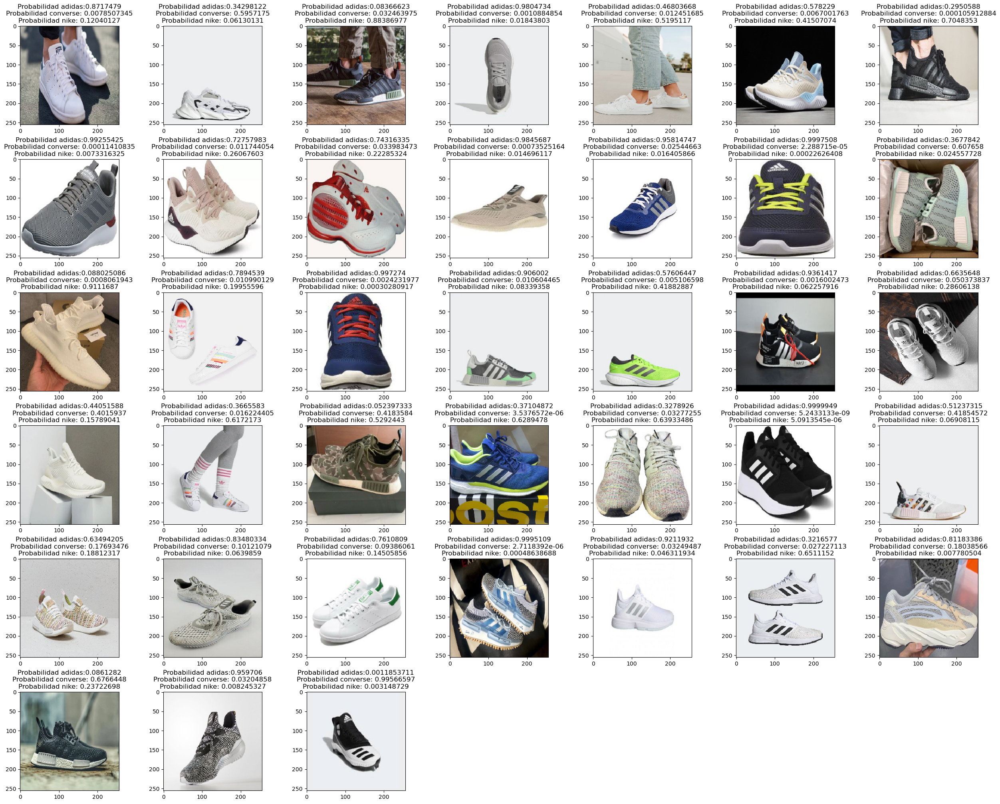

In [19]:
current_dir = os.getcwd()
i = 0
probs = []
plt.figure(figsize=(25, 25))
plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
for file in os.listdir( current_dir + '/archive2/test/adidas/'):
    plt.subplot(7, 7, i + 1)
    i = i+1
    img = load_img(current_dir + '/archive2/test/adidas/' + file, target_size = (img_width, img_height), grayscale=False)  
    x = img_to_array(img)  
    img_batch = np.expand_dims(x, axis=0)
    prediction = model.predict(img_batch)
    plt.title(prediction)
    plt.title( 'Probabilidad adidas:' + str(prediction[0][0]) + '\nProbabilidad converse: ' + str(prediction[0][1]) + '\nProbabilidad nike: ' + str(prediction[0][2])) 
    plt.imshow(img)

1/1 [==============================] - 0s 198ms/step


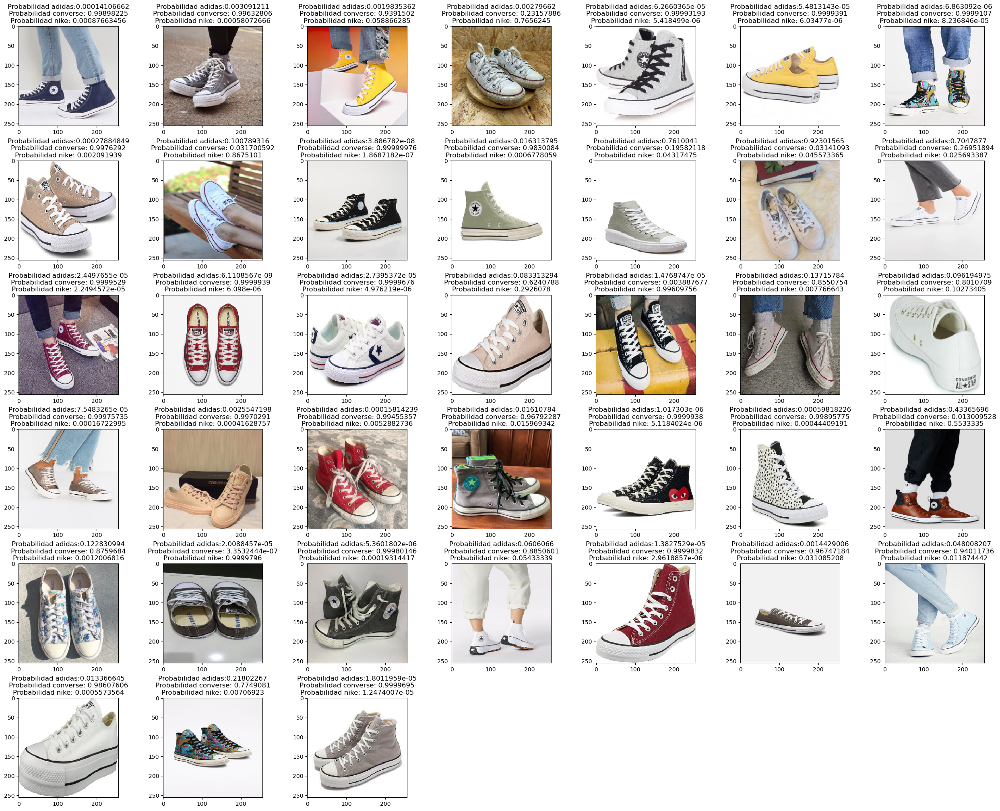

In [18]:
current_dir = os.getcwd()
i = 0
probs = []
plt.figure(figsize=(25, 25))
plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
for file in os.listdir( current_dir + '/archive2/test/converse/'):
    plt.subplot(7, 7, i + 1)
    i = i+1
    img = load_img(current_dir + '/archive2/test/converse/' + file, target_size = (img_width, img_height), grayscale=False)  
    x = img_to_array(img)  
    img_batch = np.expand_dims(x, axis=0)
    prediction = model.predict(img_batch)
    plt.title(prediction)
    plt.title( 'Probabilidad adidas:' + str(prediction[0][0]) + '\nProbabilidad converse: ' + str(prediction[0][1]) + '\nProbabilidad nike: ' + str(prediction[0][2])) 
    plt.imshow(img)

1/1 [==============================] - 0s 120ms/step


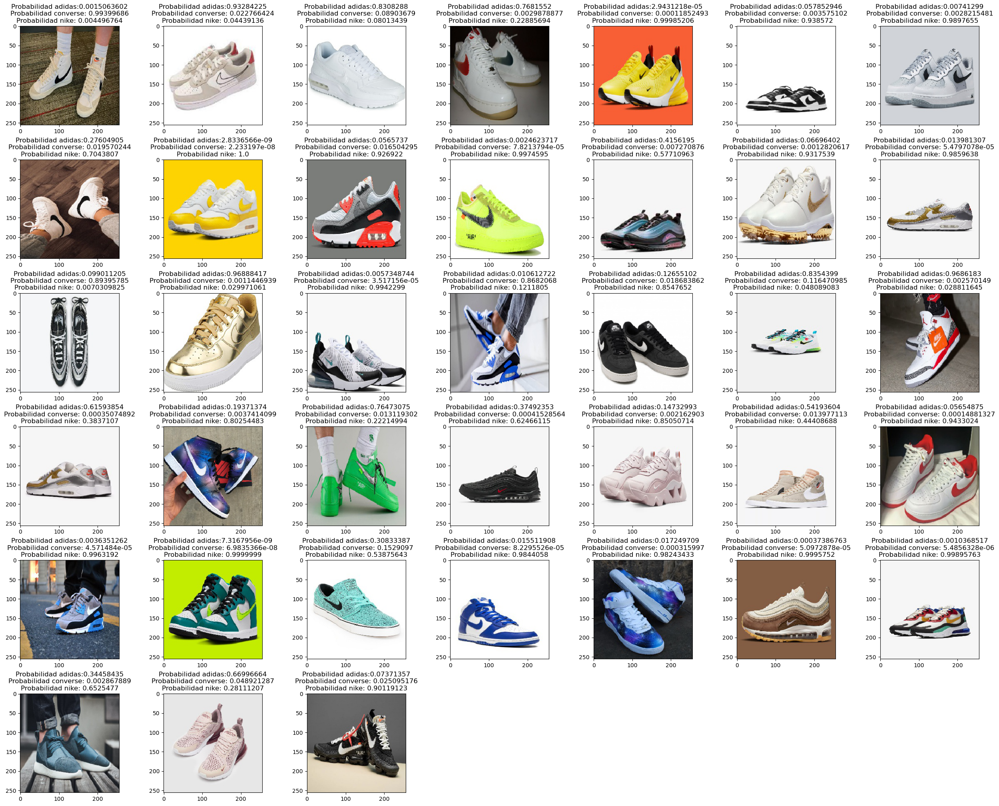

In [17]:
current_dir = os.getcwd()
i = 0
probs = []
plt.figure(figsize=(25, 25))
plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
for file in os.listdir( current_dir + '/archive2/test/nike/'):
    plt.subplot(7, 7, i + 1)
    i = i+1
    img = load_img(current_dir + '/archive2/test/nike/' + file, target_size = (img_width, img_height), grayscale=False)  
    x = img_to_array(img)  
    img_batch = np.expand_dims(x, axis=0)
    prediction = model.predict(img_batch)
    plt.title(prediction)
    plt.title( 'Probabilidad adidas:' + str(prediction[0][0]) + '\nProbabilidad converse: ' + str(prediction[0][1]) + '\nProbabilidad nike: ' + str(prediction[0][2])) 
    plt.imshow(img)